# 🏆 Data Science I - ML Competition: Predict Academic Performance

Welcome to the Machine Learning Kaggle Competition!

## 🎯 Objective
Use the provided dataset to **predict students' final grades** based on various features (study time, failures, absences, etc.).

## 🧠 Your Task
Train and tune multiple machine learning models and aim for the best F1 Score. For the competition, you will:
- Implement 2 of the following: **Random Forest**, **Support Vector Machine**, **Neural Network**
- Include hyperparameter tuning for improved predictive accuracy
- Conclude with evaluation of the two selected models based on metrics shown in the classification report


## 🧾 Dataset
- **Filename:** `Students_Grading_Dataset.csv`
- **Target Column:** `B_or_Higher`

Let's get started!


In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

rcParams['figure.figsize'] = (15, 8)

# Section 1: Preprocessing

Question 1: Load the Academic Performance Dataset


In [46]:
academic_df = pd.read_csv('Academic_Dataset.csv')

Question 2: Show the first 5 rows


In [47]:
academic_df.head()

,Student_ID,Gender,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,B_or_Higher,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,0,22,52.29,55.03,57.82,84.22,74.06,3.99,85.90,0,6.2,0,1,1,Medium,5,4.7
1,S1002,1,24,57.19,67.05,93.68,67.70,85.70,5.05,73.79,0,20.7,0,1,3,Low,6,6.2
2,S1003,0,24,95.15,47.79,80.63,66.06,93.51,6.54,92.12,1,24.8,1,1,1,High,3,6.7
3,S1004,0,23,54.18,46.59,78.89,96.85,83.70,5.97,68.42,0,15.4,1,1,1,High,2,7.1
4,S1005,1,21,NaN,78.85,43.53,71.40,52.20,6.38,67.29,1,8.5,1,1,4,High,1,5.0


Question 3: Show the nonnull values for all columns

In [48]:
academic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3206 entries, 0 to 3205
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  3206 non-null   object 
 1   Gender                      3206 non-null   int64  
 2   Age                         3206 non-null   int64  
 3   Attendance (%)              2863 non-null   float64
 4   Midterm_Score               3206 non-null   float64
 5   Final_Score                 3206 non-null   float64
 6   Assignments_Avg             2886 non-null   float64
 7   Quizzes_Avg                 3206 non-null   float64
 8   Participation_Score         3206 non-null   float64
 9   Projects_Score              3206 non-null   float64
 10  B_or_Higher                 3206 non-null   int64  
 11  Study_Hours_per_Week        3206 non-null   float64
 12  Extracurricular_Activities  3206 non-null   int64  
 13  Internet_Access_at_Home     3206 

Question 4: Show the min, max, median, mean for all columns

In [49]:
academic_df.describe()

,Gender,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,B_or_Higher,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Stress_Level (1-10),Sleep_Hours_per_Night
count,3206.000000,3206.000000,2863.000000,3206.000000,3206.000000,2886.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000
mean,0.511853,21.039925,75.391753,70.048958,69.445165,75.186372,74.787645,5.004766,74.853624,0.493450,17.658484,0.301622,0.896132,2.506550,5.459139,6.480162
std,0.499937,1.996322,14.295928,17.089972,17.210758,14.370601,14.601180,2.869489,14.452116,0.500035,7.276542,0.459034,0.305136,1.121811,2.855225,1.457031
min,0.000000,18.000000,50.010000,40.010000,40.000000,50.000000,50.030000,0.000000,50.010000,0.000000,5.000000,0.000000,0.000000,1.000000,1.000000,4.000000
25%,0.000000,19.000000,63.140000,55.442500,54.460000,62.632500,62.250000,2.530000,62.142500,0.000000,11.400000,0.000000,1.000000,2.000000,3.000000,5.200000
50%,1.000000,21.000000,75.730000,70.025000,69.295000,75.255000,74.475000,5.000000,74.930000,0.000000,17.400000,0.000000,1.000000,2.000000,5.000000,6.500000
75%,1.000000,23.000000,87.170000,84.487500,84.102500,87.517500,87.657500,7.530000,87.340000,1.000000,24.100000,1.000000,1.000000,4.000000,8.000000,7.700000
max,1.000000,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,1.000000,30.000000,1.000000,1.000000,4.000000,10.000000,9.000000


Question 5: Drop any columns that are not needed

In [50]:
academic_df = academic_df.drop(columns='Student_ID')


Question 6: Address missing values through Imputation or Dropping

In [51]:
academic_df.dropna()
academic_df['Attendance (%)'] = academic_df['Attendance (%)'].fillna(academic_df['Attendance (%)'].mean())
academic_df['Assignments_Avg'] = academic_df['Assignments_Avg'].fillna(academic_df['Assignments_Avg'].mean())

Question 7: Convert the Family_Income_Level column to numeric

In [52]:
family_map = {'Low': 0, 'Medium': 1, 'High': 2}

academic_df['Family_Income_Level'] = academic_df['Family_Income_Level'].map(family_map)

academic_df.head()

,Gender,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,B_or_Higher,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,0,22,52.290000,55.03,57.82,84.22,74.06,3.99,85.90,0,6.2,0,1,1,1,5,4.7
1,1,24,57.190000,67.05,93.68,67.70,85.70,5.05,73.79,0,20.7,0,1,3,0,6,6.2
2,0,24,95.150000,47.79,80.63,66.06,93.51,6.54,92.12,1,24.8,1,1,1,2,3,6.7
3,0,23,54.180000,46.59,78.89,96.85,83.70,5.97,68.42,0,15.4,1,1,1,2,2,7.1
4,1,21,75.391753,78.85,43.53,71.40,52.20,6.38,67.29,1,8.5,1,1,4,2,1,5.0


# Section 2: Data Exploration

Question 1: Create a pairplot of the dataset

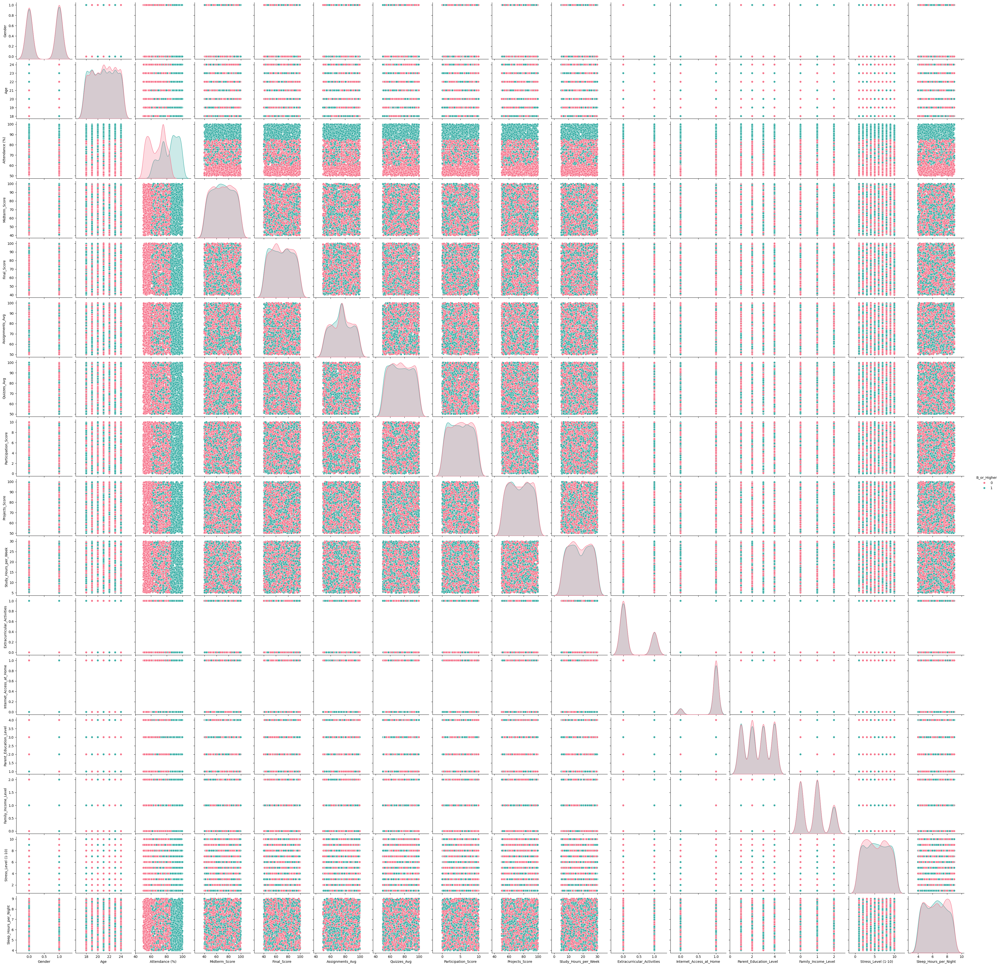

In [71]:
sns.pairplot(academic_df, hue='B_or_Higher', palette='husl')
plt.show()

Question 2 [Text]: Make 2 observations from the pairplot

- Student with parent education level 3 are more likely to have B or higher grade.
- There are moderately more number of students achieved B or higher with no internet access than with it.

Question 3: Create a heatmap of the variables (hint: pass the argument "fmt='.3f'" into the heatmap for improved readability)

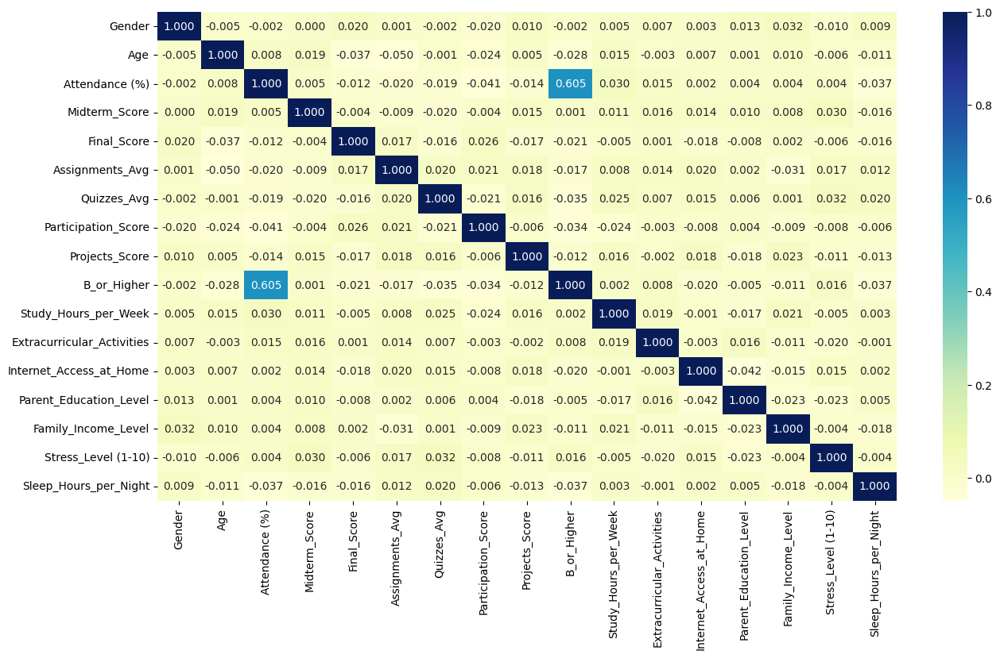

In [54]:
sns.heatmap(academic_df.corr(), annot=True, cmap='YlGnBu', fmt='.3f')
plt.show()

Question 4 [Text]: What do you notice from the heatmap?

- There's a moderately strong correlation of 0.605 between Attendance and B or higher.
- There's little correlations between all other variables.
- No multi collinearlity occurs.

# Section 3: Model Creation

Question 1: Create an 'X' variable and the target 'y' variable ("B_or_Higher")

In [55]:
y = academic_df['B_or_Higher']
X = academic_df.drop(columns='B_or_Higher')

Question 2: Do a train test split of the dataset with a test size of 30%

In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


Question 3: Scale the training and testing data

In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

Question 4: Select and fit a model for the dataset, then show accuracy

In [58]:
X_train_scaled.isnull()

,Gender,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2239,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2240,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2241,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2242,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [65]:
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

logmodel = LogisticRegression(max_iter=1000)
logmodel.fit(X_train_scaled,y_train)
log_preds = logmodel.predict(X_test_scaled)

print(accuracy_score(y_test, log_preds))

0.7463617463617463



Question 5: Select and fit a second model for the dataset, then show accuracy

In [66]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100)

rfc.fit(X_train_scaled, y_train)
rfc_preds = rfc.predict(X_test_scaled)

print(accuracy_score(y_test, rfc_preds))

0.7806652806652806


# Section 4: Model Evaluation

Question 1: Show the confusion matrix and classification report for the first model

In [69]:
from sklearn.metrics import classification_report, confusion_matrix

cm = confusion_matrix(y_test, log_preds)
print(cm)

print(classification_report(y_test, log_preds))

[[378 134]
 [110 340]]
              precision    recall  f1-score   support

           0       0.77      0.74      0.76       512
           1       0.72      0.76      0.74       450

    accuracy                           0.75       962
   macro avg       0.75      0.75      0.75       962
weighted avg       0.75      0.75      0.75       962



Question 2: Show the confusion matrix and classification report for the second model

In [68]:
rcm = confusion_matrix(y_test, rfc_preds)
print(rcm)

print(classification_report(y_test, rfc_preds))

[[473  39]
 [172 278]]
              precision    recall  f1-score   support

           0       0.73      0.92      0.82       512
           1       0.88      0.62      0.72       450

    accuracy                           0.78       962
   macro avg       0.81      0.77      0.77       962
weighted avg       0.80      0.78      0.77       962




Question 3 [Text]: Which model performed best of the two?

The Random Forest Classifier performed the best compared to the Logistic Regression in terms of precision, recall and accuracy (with an accuracy of 0.78 vs 0.75).


Question 4 [Text]: Evaluate the performance of your best model and explain what you can conclude from the precision and recall


The Random Forest Classifier had a wider range in terms of precision and recall values for the different classes: It had significantly higher precision (True Positives/Predicted Positives) for class 1 of students who earned a B or Higher, and had a bit higher recall (True Positives/Total Positives) for class 0 of students who did not earn a B or Higher. As a result, the model's performance would be more erratic if there was a larger class imbalance.

Question 5: Compute and compare the Adjusted Rand Index (ARI) for both models


In [70]:
from sklearn.metrics.cluster import adjusted_rand_score

print("Logistic ARI: ",adjusted_rand_score(y_test, log_preds))
print("RFC ARI: ",adjusted_rand_score(y_test, rfc_preds))

Logistic ARI:  0.24199044447051332
RFC ARI:  0.3141327008121759


Question 6 : Why is comparing different models statistically complex, and how does ARI help?

- Models take different assumptions about the data, such as linearity and normality. They can be more complex when adding more variables, leading to overfitting. It also can be hard to interpret as models can have different metrics.

- ARI help by validates clustering results, identify the most effective algorithms and parameters, avoid misleading interpretations of clustering results

Question 7 [Text]: Discuss how normalization of results (such as scaling or standardizing metrics) allows for fair model comparison and why this is important

It ensures that all features contribute equally to the analysis. It's important because preventing larger-scale features from dominating smaller ones is crucial for an unbiased results and improved model performance.